**The flow of the Notebook:**

1. Description of the Problem Statement.

2. Car Damage Detection Dataset Loading.

3. Check The Dataset.

4. Split The Dataset in Train, Test and Validation Set.

5. Apply Data Augmentation.

6. Hyper Parameter Tuning, and verification for improving the performance.

7. Training the Model. (AlexNet Model Implementation using Tensorflow Functional API)

8. Save the trained model.

9. Visualize Tensorboard.

10. Check Performance of the Model.

11. Model Evaluation (Confusion Matrix, Classification Report, TP,FP,TN,FN,Precision, Recall and F1-Score, Precision-Recall Curve,ROC and AUC Curve).

12. Convert Tensorflow model into ONNX format and TF Lite format Then compare the compressed models file size, Inference Time and Accuracy.(model inference lightening and speeding for implementation on Edge Device)

13. Apply Basic FastAPI Technique.

14. MLOps: Apply Basic MLFlow Technique for model tracking.  


**Problem Statement:**

Drowsy Driving is a deadly combination of driving and sleepiness. The number of road accidents due to Drowsy Driving is increasing at an alarming rate worldwide. Not having a proper sleep is the main reason behind drowsiness while driving.

However, other reasons like sleep disorders, medication, alcohol consumption, or driving during night shifts can also cause drowsiness while driving.

**Import Libraries**

In [3]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping,LearningRateScheduler,CSVLogger, ModelCheckpoint
from sklearn.metrics import confusion_matrix ,classification_report
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

**Define Image Size, Batch Size and Number Of Channels**

In [4]:
IMAGE_SIZE = 128
BATCH_SIZE = 32
CHANNELS = 3

**Driver Drowsiness Detection Data Set Loading**

In [5]:
import numpy as np
import tensorflow as tf

# Load the compressed .npz file
data = np.load('/content/driver_drowsiness_detection/dataset_compressed.npz')

# Assuming 'images' and 'labels' are the keys in the .npz file
images = data['arr_0']
labels = data['arr_1']

# Map string labels to integer values
label_mapping = {'Closed': 0, 'Open': 1}  # Adjust this based on your actual label names

# Convert labels to integer values using the label mapping
labels = np.array([label_mapping[label] for label in labels])

# Convert labels to one-hot encoding
#number_of_class = 2
class_names = list(label_mapping.keys())  # Create a list of class names

# Create TensorFlow datasets
dataset = tf.data.Dataset.from_tensor_slices((images, labels))

# Shuffle and prefetch the dataset

buffer_size = len(images)
dataset = dataset.shuffle(buffer_size).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)

**Show Class Names**

In [6]:
# Print the class names
print("Class names:", class_names)

Class names: ['Closed', 'Open']


**Check The Batch Size, Image Size , Number Of Channels and Labels**

In [7]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())



(32, 128, 128, 3)
[1 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 0 0 0]


**Check The Image Data**

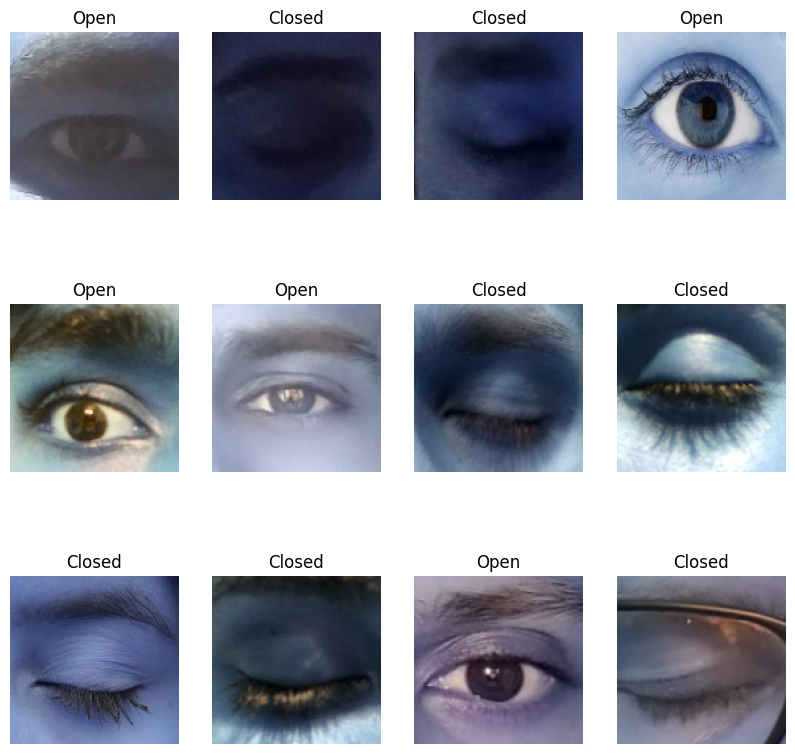

In [8]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

**Split The Data Into Train, Validation and Test Set**

In [9]:
def get_dataset_partitions(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=900):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds



In [10]:
train_ds, val_ds, test_ds = get_dataset_partitions(dataset)

In [11]:
len(train_ds)

36

In [12]:
len(val_ds)

4

In [13]:
len(test_ds)

6

**Apply Data Augmentation**

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of ImageDataGenerator for data augmentation
data_augmentation = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    #rescale=1.0 / 255  # Rescale pixel values to [0, 1]
)

# Extract images and labels from the training dataset
train_images = []
train_labels = []
for images_batch, labels_batch in train_ds:
    train_images.append(images_batch.numpy())
    train_labels.append(labels_batch.numpy())
train_images = np.concatenate(train_images)
train_labels = np.concatenate(train_labels)

# Apply data augmentation to the training dataset
augmented_train_ds = data_augmentation.flow(
    x=train_images,
    y=train_labels,  # You need to specify the labels as well
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=123
)

# Apply rescaling to the validation and test datasets
#val_ds = val_ds.map(lambda x, y: (x / 255, y))
#test_ds = test_ds.map(lambda x, y: (x / 255, y))

**Apply Rescaling To The Train, Validation and Test Dataset**

In [ ]:
train_ds = train_ds.map(lambda x, y: (x / 255, y))
val_ds = val_ds.map(lambda x, y: (x / 255, y))
test_ds = test_ds.map(lambda x, y: (x / 255, y))

**Apply Cache and Prefetch For Speeding Up Data Processing Pipeline**

In [15]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

**Define Number Of Class**

In [16]:
number_of_class = len(class_names)
print(number_of_class)

2


**AlexNet Model Architecture**

In [17]:
def AlexNet(input_shape, number_of_class,activation):
  input_layer = tf.keras.Input(shape=input_shape)

#Convolutional Layer 1
  conv_1 = layers.Conv2D(filters=96,kernel_size=(11,11),strides=(4,4),activation='relu')(input_layer)
  max_pool_1 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_1)
  bn_1 =layers.BatchNormalization()(max_pool_1)

#Convolutional Layer 2
  conv_2 = layers.Conv2D(filters=256,kernel_size=(5,5),activation='relu',padding='same')(bn_1)
  max_pool_2 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_2)
  bn_2 = layers.BatchNormalization()(max_pool_2)

#Convolutional Layer 3
  conv_3 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(bn_2)

#Convolutional Layer 4
  conv_4 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(conv_3)

#Convolutional Layer 5
  conv_5 = layers.Conv2D(filters=384,kernel_size=(3,3),activation='relu',padding='same')(conv_4)

# Last pooling layer
  max_pool_3 = layers.MaxPooling2D(pool_size=(3,3),strides=(2,2))(conv_5)

#Flatten layer
  flatten = layers.Flatten()(max_pool_3)

#Fully Connected Layer 1
  fc_1 = layers.Dense(units=4096,activation='relu')(flatten)
  drop_out_1 = layers.Dropout(0.5)(fc_1)

#Fully Connected Layer 2
  fc_2 = layers.Dense(units=4096,activation='relu')(drop_out_1)
  drop_out_2 = layers.Dropout(0.5)(fc_2)

#Fully Connected Layer 3
  fc_3 = layers.Dense(units=4096,activation='relu')(drop_out_2)
  drop_out_3 = layers.Dropout(0.5)(fc_3)

# Output Layer
  output_layer = layers.Dense(units=number_of_class,activation=activation)(drop_out_3)

#Create the model
  model = models.Model(inputs=input_layer,outputs=output_layer)

  return model
input_shape = (IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
number_of_class = number_of_class
activation='sigmoid'
alex_net_model = AlexNet(input_shape,number_of_class,activation)

alex_net_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 96)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 96)       384       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 256)        0     

**Compile AlexNet Model**

In [18]:
alex_net_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

**Define AlexNet Log Directory**

In [19]:
log_dir='logs_alexnet'

**Define Learning Rate Scheduler Callback**

In [20]:
# Define the learning rate schedule using a cosine annealing function
def cosine_annealing(epoch, lr):
    max_epochs = 10  # Total number of epochs
    max_lr = 0.01  # Maximum learning rate
    min_lr = 0.001  # Minimum learning rate

    # Apply cosine annealing formula
    lr = min_lr + 0.5 * (max_lr - min_lr) * (1 + tf.math.cos(epoch / max_epochs * np.pi))
    return lr

lr_scheduler_callback = LearningRateScheduler(cosine_annealing)

**Define Early Stopping Callback**

In [21]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',  # Monitor validation accuracy
    patience=3,  # Stop training if validation accuracy doesn't improve for 3 epochs
    restore_best_weights=True  # Restore model weights from the epoch with the best validation loss
)

**Define CSV Logger Callback**

In [22]:
csv_logger = CSVLogger(
    filename=log_dir + '/training_log.csv',  # Specify the CSV file path
    separator=',',  # Separator used in the CSV file
    append=False  # Append to the existing file if it exists
)

**Define Check Point Callback**

In [23]:
# Create the ModelCheckpoint callback
checkpoint_path = log_dir + '/best_alex_net_model.h5'
checkpoint_callback = ModelCheckpoint(
    checkpoint_path,
    monitor="val_accuracy",  # Choose the metric to monitor for saving the best model
    save_best_only=True,
    mode="max",  # Choose "max" if your metric should be maximized, "min" if minimized
    verbose=1
)

**Define Tensorboard Callback**

In [24]:
# Define the TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

**AlexNet Model Training**

In [25]:
EPOCHS = 10
alex_net_history = alex_net_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
    callbacks=[lr_scheduler_callback,early_stopping,csv_logger,checkpoint_callback,tensorboard_callback]
)

Epoch 1/10
36/36 [==============================] - ETA: 0s - loss: 22616.1406 - accuracy: 0.4850
Epoch 1: val_accuracy improved from -inf to 0.49219, saving model to logs_alexnet/best_alex_net_model.h5
36/36 [==============================] - 124s 3s/step - loss: 22616.1406 - accuracy: 0.4850 - val_loss: 0.8981 - val_accuracy: 0.4922 - lr: 0.0100
Epoch 2/10
36/36 [==============================] - ETA: 0s - loss: 3.5744 - accuracy: 0.5239
Epoch 2: val_accuracy improved from 0.49219 to 0.50781, saving model to logs_alexnet/best_alex_net_model.h5
36/36 [==============================] - 113s 3s/step - loss: 3.5744 - accuracy: 0.5239 - val_loss: 0.7980 - val_accuracy: 0.5078 - lr: 0.0098
Epoch 3/10
36/36 [==============================] - ETA: 0s - loss: 1.6443 - accuracy: 0.5336
Epoch 3: val_accuracy improved from 0.50781 to 0.53125, saving model to logs_alexnet/best_alex_net_model.h5
36/36 [==============================] - 112s 3s/step - loss: 1.6443 - accuracy: 0.5336 - val_loss: 0.6

**Save AlexNet Model**

In [26]:
# Define a path to save the model
model_save_path = "/content/models/AlexNet"

# Save the model
alex_net_model.save(model_save_path)

print("Model saved at:", model_save_path)

Model saved at: /content/models/AlexNet


**TensorBoard Visualization**

In [27]:
%load_ext tensorboard
%tensorboard --logdir logs_alexnet

<IPython.core.display.Javascript object>

**Evaluate AlexNet Model Score**

In [28]:
scores = alex_net_model.evaluate(test_ds)

6/6 [==============================] - 2s 402ms/step - loss: 0.7195 - accuracy: 0.5417


In [29]:
alex_net_history.params

{'verbose': 1, 'epochs': 10, 'steps': 36}

In [30]:
alex_net_history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

**Ploat Accuracy and Loss Curve**

In [31]:
acc = alex_net_history.history['accuracy']
val_acc = alex_net_history.history['val_accuracy']

loss = alex_net_history.history['loss']
val_loss = alex_net_history.history['val_loss']

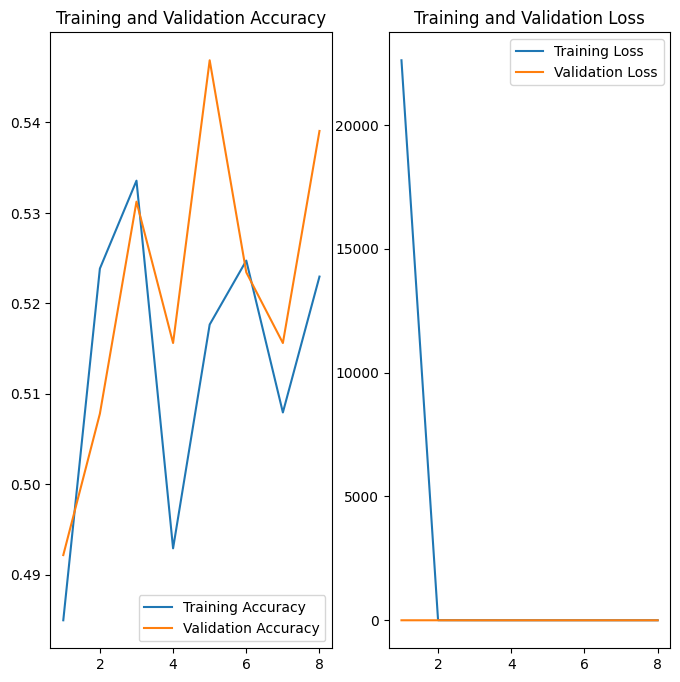

In [32]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(acc) + 1), acc, label='Training Accuracy')
plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(1, len(loss) + 1), loss, label='Training Loss')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**Single Prediction**

first image to predict
actual label: Closed
1/1 [==============================] - 1s 610ms/step
predicted label: Closed


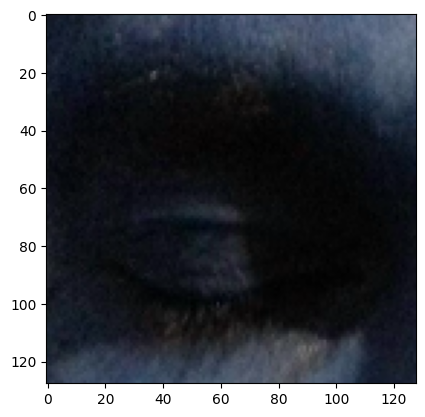

In [33]:
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction_AlexNet = alex_net_model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction_AlexNet[0])])

**Write a Function For Inference**

In [34]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = alex_net_model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Run Inference On Few Test Images**

1/1 [==============================] - 0s 58ms/step


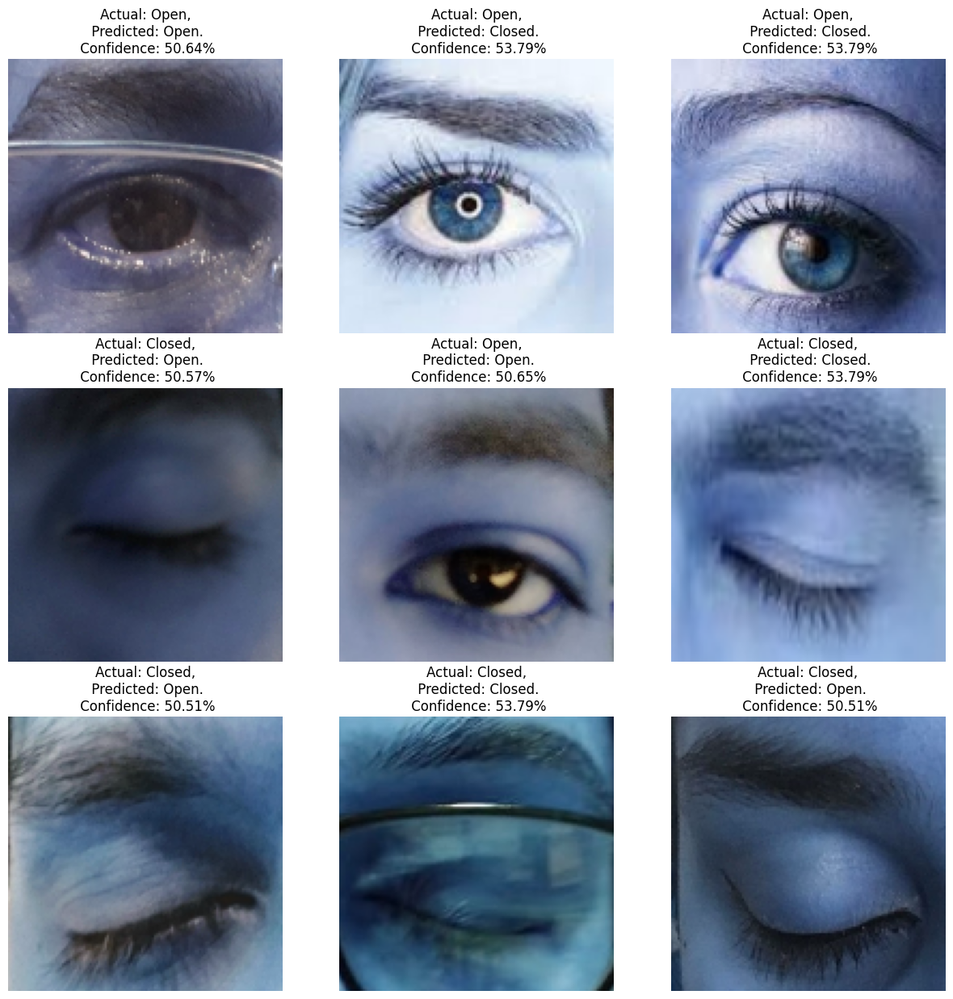

In [35]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(alex_net_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

**Model Evaluation**

6/6 [==============================] - 4s 707ms/step


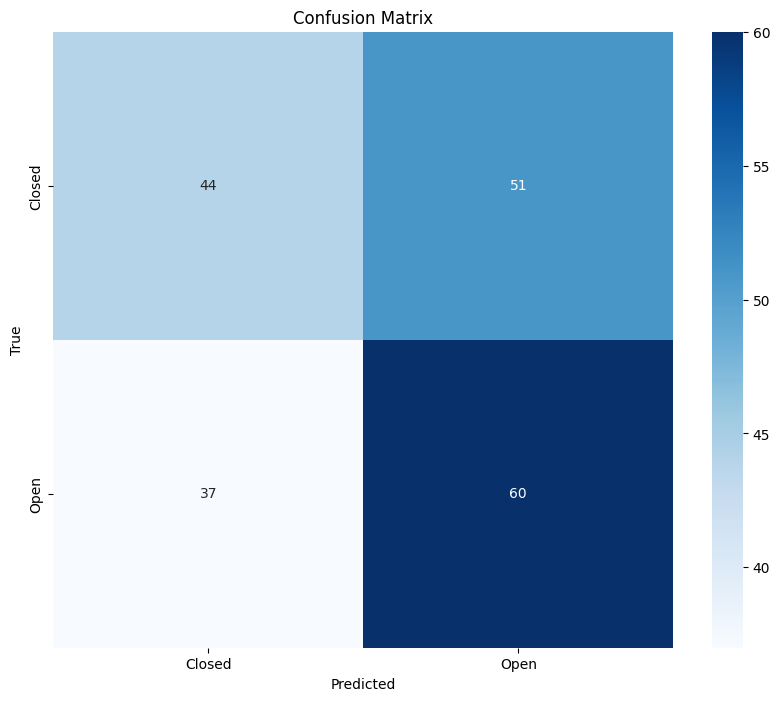

True Positives (TP): 60
False Positives (FP): 51
True Negatives (TN): 44
False Negatives (FN): 37
Recall (Sensitivity): 0.6185567010309279
              precision    recall  f1-score   support

      Closed       0.54      0.46      0.50        95
        Open       0.54      0.62      0.58        97

    accuracy                           0.54       192
   macro avg       0.54      0.54      0.54       192
weighted avg       0.54      0.54      0.54       192



In [36]:
# Generate predictions for the test dataset
test_images = []
test_labels = []
for images_batch, labels_batch in test_ds:
    test_images.extend(images_batch.numpy())
    test_labels.extend(labels_batch.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

predictions = alex_net_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)

# Plot confusion matrix as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# Calculate TP, FP, TN, FN
tp = conf_matrix[1, 1]
fp = conf_matrix[0, 1]
tn = conf_matrix[0, 0]
fn = conf_matrix[1, 0]

# Calculate Recall (Sensitivity)
recall = tp / (tp + fn)

# Print the metrics
print("True Positives (TP):", tp)
print("False Positives (FP):", fp)
print("True Negatives (TN):", tn)
print("False Negatives (FN):", fn)
print("Recall (Sensitivity):", recall)

# Classification Report
class_report = classification_report(test_labels, predicted_labels, target_names=class_names)
print(class_report)

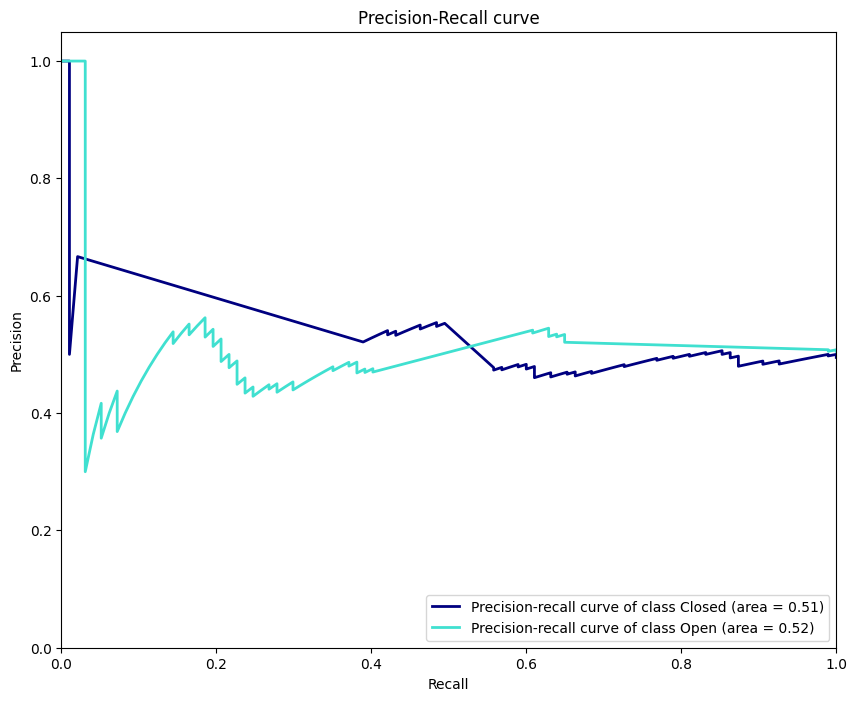

In [37]:

# Calculate precision-recall curves and average precision
precision = dict()
recall = dict()
average_precision = dict()
for i in range(number_of_class):
    precision[i], recall[i], _ = precision_recall_curve(test_labels == i, predictions[:, i])
    average_precision[i] = average_precision_score(test_labels == i, predictions[:, i])

# Plot precision-recall curves
plt.figure(figsize=(10, 8))
colors = ['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal']
for i, color in zip(range(number_of_class), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='Precision-recall curve of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], average_precision[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.legend(loc="lower right")
plt.show()


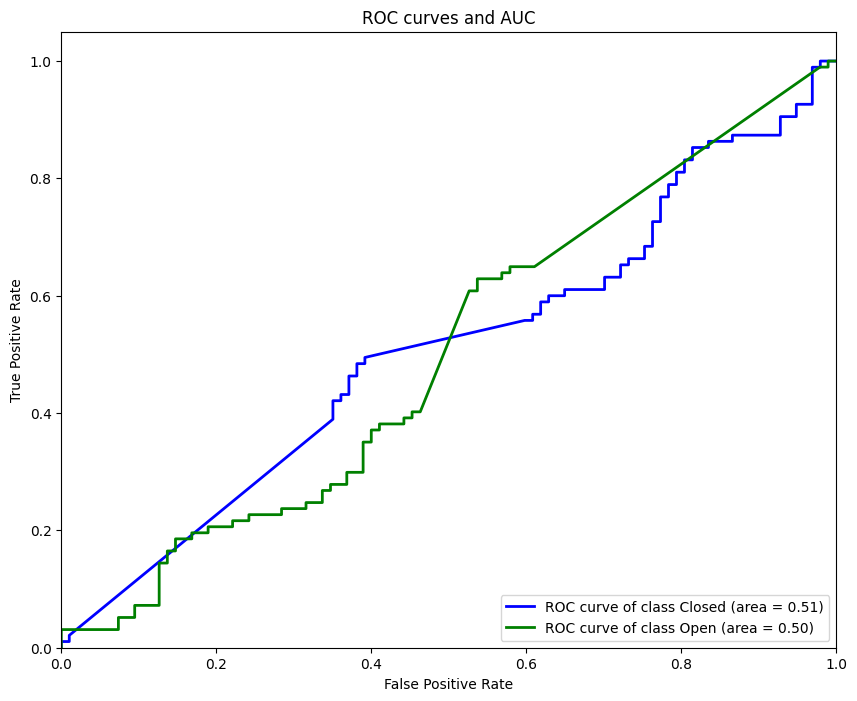

In [38]:
# Calculate ROC curves and AUC
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(number_of_class):
    fpr[i], tpr[i], _ = roc_curve(test_labels == i, predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
colors = ['blue', 'green', 'red', 'cyan', 'magenta']
for i, color in zip(range(number_of_class), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves and AUC')
plt.legend(loc="lower right")
plt.show()

**Building Pipeline For Predictions On Full Face Images:**

MTCNN (Multi-task Cascaded Convolutional Networks) is a deep learning-based face detection framework that is commonly used for detecting faces in images. It is specifically designed to address the challenges of face detection in real-world scenarios, including variations in pose, lighting conditions, occlusions, and different scales of faces.

In [39]:
!pip install mtcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.5 MB/s eta 0:00:00


In [40]:
import cv2
import numpy as np
from mtcnn import MTCNN

# Load the pre-trained models
face_detector = MTCNN()

def full_face_detection_pipeline(input_image_path):
    test_image = cv2.imread(input_image_path)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    test_image = cv2.resize(test_image, (800, 600))  # Adjust the size as needed

    # Detect faces using MTCNN
    faces = face_detector.detect_faces(test_image)

    for face in faces:
        x, y, w, h = face['box']
        face_aligned = test_image[y:y+h, x:x+w]

        # Preprocess the aligned face
        aligned_eye = cv2.resize(face_aligned, (128, 128))
        aligned_eye = np.expand_dims(aligned_eye, axis=0)

        # Predict using the eye model
        prediction = alex_net_model.predict(aligned_eye)[0]

        # Determine the class based on the prediction
        predicted_class = "Sleeping" if prediction[0]< 0.5 else "Not Sleeping"

        color = (0, 0, 255) if predicted_class == "Sleeping" else (0, 255, 0)
        cv2.rectangle(test_image, (x, y), (x+w, y+h), color, 8)
        cv2.putText(test_image, predicted_class, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, color, 3)

    output_path = 'test_image_prediction.jpg'
    cv2.imwrite(output_path, test_image)
    return output_path

1/1 [==============================] - 1s 1s/step


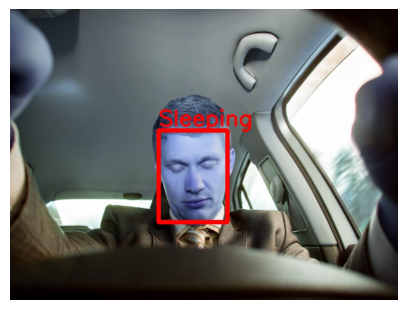

In [41]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/driver_drowsiness_detection/sleepy-driver.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 232ms/step


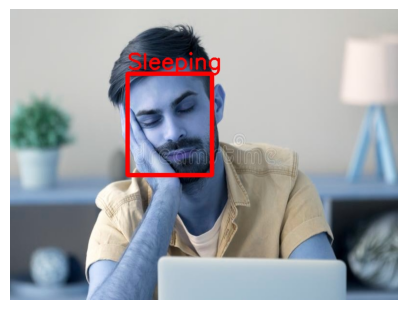

In [43]:
figure = plt.figure(figsize=(5, 5))
predicted_image = cv2.imread(full_face_detection_pipeline('/content/driver_drowsiness_detection/drowsy_person.jpg'))
predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
plt.imshow(predicted_image)
plt.axis('off')
plt.show()

**Convert Tensorflow model into ONNX format and TF Lite format Then compare the compressed models file size, Inference Time and Accuracy:(Model Inference Lightening and Speeding for Implementation on Edge Device)**

In [44]:
!pip install tf2onnx
!pip install onnx
!pip install onnxruntime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 451.2/451.2 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 34.2 MB/s eta 0:00:00
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.5.26
    Uninstalling flatbuffers-23.5.26:
      Successfully uninstalled flatbuffers-23.5.26
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.2 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.1 MB/s eta 0:00:00


Model File Sizes:
TensorFlow Model Size: 504.21241569519043 MB
TensorFlow Lite Model Size: 168.0697250366211 MB
ONNX Model Size: 168.0718173980713 MB
<<<<<<<<<<<=========================================>>>>>>>>>>>


1/1 [==============================] - 0s 471ms/step
Inference Times:
TensorFlow Inference Time: 0.5570199489593506 seconds
TensorFlow Lite Inference Time: 0.046854496002197266 seconds
ONNX Inference Time: 1.1041381359100342 seconds
<<<<<<<<<<<=========================================>>>>>>>>>>>
<<<<<<<<<<<=========================================>>>>>>>>>>>
Predicted Label and Confidence:
TensorFlow: Not Sleeping  (Confidence: 50.51%)
TensorFlow Lite: Not Sleeping  (Confidence: 50.51%)
ONNX: Not Sleeping  (Confidence: 50.51%)


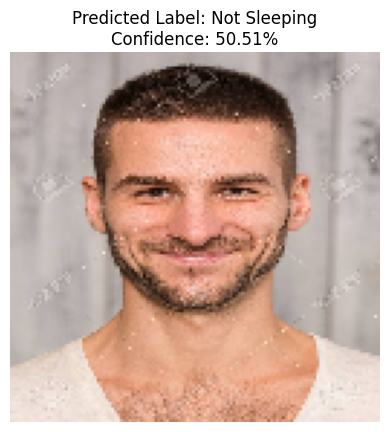

In [48]:
import tensorflow as tf
import tf2onnx
import onnxruntime
import time


def get_file_size(file_path):
    return os.path.getsize(file_path) / (1024 * 1024)  # Convert bytes to MB

def compare_models(saved_model_path, image_path):
    # Load the saved TensorFlow model (SavedModel format)
    tf_model = tf.keras.models.load_model(saved_model_path)

    # Convert the TensorFlow model to TensorFlow Lite format
    tflite_model = tf.keras.models.load_model(saved_model_path)
    converter = tf.lite.TFLiteConverter.from_keras_model(tflite_model)
    tflite_model = converter.convert()

    # Convert the TensorFlow model to ONNX format
    onnx_model, _ = tf2onnx.convert.from_keras(tf_model)

    # Save the TensorFlow Lite model to a file
    tflite_model_path = 'AlexNet.tflite'
    with open(tflite_model_path, 'wb') as f:
        f.write(tflite_model)

    # Save the ONNX model to a file
    onnx_model_path = 'AlexNet.onnx'
    with open(onnx_model_path, 'wb') as f:
        f.write(onnx_model.SerializeToString())

    # Get model file sizes
    file_size = "/content/models/AlexNet/variables/variables.data-00000-of-00001"
    tf_model_size = get_file_size(file_size)
    tflite_model_size = get_file_size(tflite_model_path)
    onnx_model_size = get_file_size(onnx_model_path)

    print("Model File Sizes:")
    print("TensorFlow Model Size:", tf_model_size, "MB")
    print("TensorFlow Lite Model Size:", tflite_model_size, "MB")
    print("ONNX Model Size:", onnx_model_size, "MB")
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    # Load and preprocess the single image
    input_shape = tf_model.input_shape[1:3]  # Adjust for your model's input shape
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=input_shape)
    image_array = tf.keras.preprocessing.image.img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)

    # TensorFlow inference
    tf_start_time = time.time()
    tf_output = tf_model.predict(image_array)
    tf_end_time = time.time()
    tf_inference_time = tf_end_time - tf_start_time

    # TensorFlow Lite inference
    interpreter = tf.lite.Interpreter(model_content=tflite_model)
    interpreter.allocate_tensors()
    tflite_start_time = time.time()
    interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image_array)
    interpreter.invoke()
    tflite_output = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
    tflite_end_time = time.time()
    tflite_inference_time = tflite_end_time - tflite_start_time

    # ONNX inference
    onnx_session = onnxruntime.InferenceSession(onnx_model_path)
    input_name = onnx_session.get_inputs()[0].name
    onnx_start_time = time.time()
    onnx_output = onnx_session.run(None, {input_name: image_array})
    onnx_end_time = time.time()
    onnx_inference_time = onnx_end_time - onnx_start_time

    print("Inference Times:")
    print("TensorFlow Inference Time:", tf_inference_time, "seconds")
    print("TensorFlow Lite Inference Time:", tflite_inference_time, "seconds")
    print("ONNX Inference Time:", onnx_inference_time, "seconds")
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    # Compare predictions
    class_names = ['Sleeping', 'Not Sleeping']  # Replace with your class names
    tf_predicted_label = np.argmax(tf_output[0])
    tflite_predicted_label = np.argmax(tflite_output[0])
    onnx_predicted_label = np.argmax(onnx_output[0])
    print("<<<<<<<<<<<=========================================>>>>>>>>>>>")
    print("Predicted Label and Confidence:")
    print("TensorFlow:", class_names[tf_predicted_label], " (Confidence: {:.2f}%)".format(tf_output[0][tf_predicted_label] * 100))
    print("TensorFlow Lite:", class_names[tflite_predicted_label], " (Confidence: {:.2f}%)".format(tflite_output[0][tflite_predicted_label] * 100))
    print("ONNX:", class_names[onnx_predicted_label], " (Confidence: {:.2f}%)".format(onnx_output[0][0][onnx_predicted_label] * 100))

    # Display the image with the predicted label and confidence
    import matplotlib.pyplot as plt

    plt.imshow(image)
    plt.title("Predicted Label: {}\nConfidence: {:.2f}%".format(class_names[tf_predicted_label], tf_output[0][tf_predicted_label] * 100))
    plt.axis('off')
    plt.show()

    # Clean up: Delete temporary ONNX and TensorFlow Lite model files
    #os.remove(tflite_model_path)
    #os.remove(onnx_model_path)

# Example usage with a single image
saved_model_path = '/content/models/AlexNet'
image_path = '/content/driver_drowsiness_detection/active_person.jpg'

compare_models(saved_model_path, image_path)

**Apply Basic FastAPI Technique:**

In [49]:
!pip install fastapi
!pip install uvicorn
!pip install python-multipart
!pip install pyngrok

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 549.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-6.0.0-py3-none-any.whl size=19867 sha256=6e4a031d8b7ad4f05995d5fb4b5e20088d7d05758bfb2dbd6c106227878eae24
  Stored in directory: /root/.cache/pip/wheels/5c/42/78/0c3d438d7f5730451a25f7ac6cbf4391759d22a67576ed7c2c
Successfully built pyngrok


In [ ]:
from fastapi import FastAPI, File, UploadFile
from fastapi.middleware.cors import CORSMiddleware
import uvicorn
from pyngrok import ngrok
import numpy as np
from io import BytesIO
from PIL import Image
import tensorflow as tf

app = FastAPI()

origins = [
    "http://localhost",
    "http://localhost:8000",
]
app.add_middleware(
    CORSMiddleware,
    allow_origins=origins,
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)

MODEL = tf.keras.models.load_model("/content/models/AlexNet")

CLASS_NAMES = ['Sleeping', 'Not Sleeping']

@app.get("/ping")
async def ping():
    return "Hello, I am alive"

def read_file_as_image(data) -> np.ndarray:
    image = np.array(Image.open(BytesIO(data)))
    return image

@app.post("/predict")
async def predict(
    file: UploadFile = File(...)
):
    image = read_file_as_image(await file.read())
    img_batch = np.expand_dims(image, 0)

    predictions = MODEL.predict(img_batch)

    predicted_class = CLASS_NAMES[np.argmax(predictions[0])]
    confidence = np.max(predictions[0])
    return {
        'class': predicted_class,
        'confidence': float(confidence)
    }

if __name__ == "__main__":
    uvicorn.run(app, host='localhost', port=8000)


# Expose the FastAPI app using ngrok
public_url = ngrok.connect(port=8000)
print("Public URL:", public_url)

# Use Ctrl+C to stop the ngrok tunnel when you're done

**MLOps: Apply Basic MLFlow Technique for model tracking:**

In [50]:
!pip install mlflow
!pip install pyngrok

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.3/225.3 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.1/148.1 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.1/143.1 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.1 MB/s eta 0:00:00
  Created wheel for databricks-cli: filename=databricks_cli-0.17.7-py3-none-any.whl size=143856 sha256=4840dcee2586bd4b32a45259a369d92e17097c958a5c38a9b6d343669c805566
  Stored in directory: /root/.cache/pip/wheels/ae/63/93/5402c1a09c

In [ ]:
import mlflow
from mlflow import log_metric, log_param, log_artifacts
from pyngrok import ngrok

# Log parameters to MLflow
mlflow.start_run()
log_param("input_shape", input_shape)
log_param("optimizer", "Adam")
log_param("loss_function", "categorical_crossentropy")
log_metric("final_train_accuracy", alex_net_history.history['accuracy'][-1])
log_metric("final_val_accuracy", alex_net_history.history['val_accuracy'][-1])
log_artifacts("/content/models/AlexNet")

# Start ngrok to create a tunnel to the MLflow UI
get_ipython().system_raw("mlflow ui --port 8000 &")
get_ipython().system_raw("./ngrok http 8000 &")

# Get the public URL for the MLflow UI using ngrok
import time
time.sleep(2)  # Give ngrok time to start

from urllib.parse import urlparse
from urllib.request import urlopen
import json

# Fetch ngrok public URL
ngrok_url = !curl -s http://localhost:4040/api/tunnels | python3 -c "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

# Parse the URL and get the ngrok domain
parsed_url = urlparse(ngrok_url[0])
ngrok_domain = parsed_url.netloc

# Construct the full MLflow UI URL
mlflow_ui_url = f"http://{ngrok_domain}:8000"

print("MLflow UI URL:", mlflow_ui_url)


In [ ]:
mlflow.end_run()

**Zip and Download Model File**

In [ ]:
!zip -r models.zip models/

In [ ]:
from google.colab import files
files.download('models.zip')